A note book for documenting qualitative results

In [5]:
import os
import matplotlib.pyplot as plt
import torchvision
import torch
import pandas as pd
import numpy as np

from models import get_inception_transform
from data_loaders import CUB_extnded_dataset,CUB_CtoY_dataset
from IPython.display import display
from utils.notebook import display_scrollable_dataframe,plot_sailency
from sailency import get_saliency_maps,saliency_score_part

In [6]:
# Settings for the experiment your running
data_set = 'test' 

#Make the dataset
transform = get_inception_transform(mode=data_set, methode= "center")

majority_config = {'CUB_dir':r'data/CUB_200_2011',
                'split_file':r'data/train_test_val.pkl',
                'use_majority_voting':True,
                'min_class_count':0,
                'return_visibility':False}

NoN_majority_config = {'CUB_dir':r'data/CUB_200_2011',
                'split_file':r'data/train_test_val.pkl',
                'use_majority_voting':False,
                'min_class_count':0,
                'return_visibility':False}

Non_majority_data_set = CUB_extnded_dataset(mode=data_set,config_dict=NoN_majority_config,transform=transform)

concepts_name = Non_majority_data_set.consept_labels_names

#Make the majority dataset and find the mask, we use CtoY dataset so we only need to loade the image ones 
Majority_dataset = CUB_CtoY_dataset(mode=data_set,config_dict=majority_config,transform=transform)
mask = Majority_dataset.concept_mask

#Make dataloader that return non standarized images
human_tansform = torchvision.transforms.Compose([torchvision.transforms.CenterCrop(299),torchvision.transforms.ToTensor()])
data_human = CUB_extnded_dataset(mode=data_set,config_dict=majority_config,transform=human_tansform)

#Define usefull variables
concept_names = data_human.consept_labels_names
class_names = data_human.class_labels_names
n_classes = data_human.n_classes
n_concepts = data_human.n_concepts

print(f"Number of classes: {n_classes}")
print(f"Number of concepts: {n_concepts}")

Number of classes: 200
Number of concepts: 312


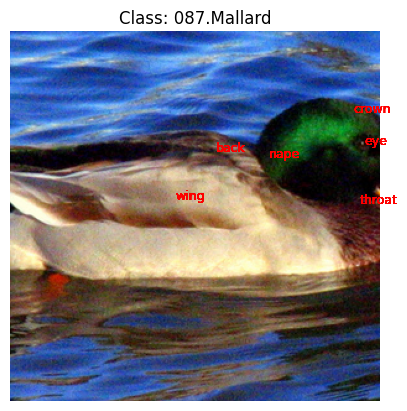

In [ ]:
# Genrate the dataset
#picturer_idx = 2447
picturer_idx = 2455
#picturer_idx = 2454 #Gadwell

img ,_,Y,coordinates = data_human.__getitem__(picturer_idx)

# Show the image and the coordinates of the concepts
plt.imshow(img.permute(1, 2, 0))
plt.title(f"Class: {class_names[torch.argmax(Y)]}")
for i in range(len(coordinates)):
    if len(coordinates[i]) > 0:

        for x,y in coordinates[i]:
            #plt.plot(x,y,'ro')
            name=concept_names[i].split("_")[1]
            if name == "forehead":
                ofset = -30

            elif name == "eye":
                ofset = 0
            else:
                ofset = 0
            
            plt.text(x+ofset,y,name,fontsize=9,color='red')
    plt.axis('off')
            
plt.size=(50,50)
plt.show()

#Load the data
X, C, Y,coordinates = Non_majority_data_set.__getitem__(picturer_idx)
coordinates = [coordinates[i] for i in mask]
# Separate the concepts and their visibility only relevant if visibility is used and no majority voting is used
if len(C.shape) == 2:
    Concepts = C[0]
    Concepts_visiblity = C[1]
else:
    Concepts = C.tolist()
    Concepts_visiblity = [None]*len(C)

X = X.unsqueeze(0)


(np.float64(-0.5), np.float64(298.5), np.float64(298.5), np.float64(-0.5))

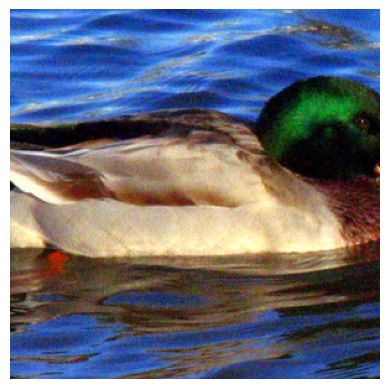

In [7]:
plt.imshow(img.permute(1, 2, 0))
plt.axis('off')

In [ ]:
#Make concept dictionary for majority filtered


#Get ture labels 
_,NoN_Majority_C,_,_ = Non_majority_data_set.__getitem__(picturer_idx)
Majority_C,_ = Majority_dataset.__getitem__(picturer_idx)

#Find distribution of the concepts
Majority_concepts = Majority_dataset.concepts
NoN_Majority_concepts = np.array([Non_majority_data_set.concepts[y] for y in Non_majority_data_set.concepts.keys()])


Concept_dict={"Concept":concept_names,
                    "Label": NoN_Majority_C[mask].numpy().astype(bool),
                    #"Label distribution": np.mean(NoN_Majority_concepts,axis=0)[mask],
                    "Majority Label": Majority_C.numpy().astype(bool),
                    #"Majority ditribution": np.mean(Majority_concepts,axis=0)
                      }
    


  

In [ ]:
#Test NoN majority joint model
model_path = r'NoMajority_models\Joint_CKTP_resize\best_Joint_model.pth'

#Load the model
Joint_model = torch.load(model_path,map_location=torch.device('cpu'),weights_only=False)
Joint_model.eval()
Joint_model.use_sigmoid = True

#Make prediction
C_hat,Y_hat = Joint_model(X)
C_hat_probability = torch.sigmoid(C_hat)
Y_hat = torch.softmax(Y_hat,dim=1)
print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")

#Make Concept prediction and other stuff
weights = Joint_model.CtoY_model.linear.weight[Y.argmax().item()]
Concept_dict["Joint Rezise"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)
#Concept_dict["Joint Rezise weights"] = weights.detach().numpy().round(2)

Predicted class: 118.House_Sparrow true class: 087.Mallard probability of true class: 0.005023895297199488


In [32]:
# Test the concept model with NoN majority voting
XtoC_Model = torch.load(r'NoMajority_models\Concepts_CKTP_Resize\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()

CtoY_Model = torch.load(r'NoMajority_models\Sequential_CKTP__Resize\best_CtoY_model.pth',map_location=torch.device('cpu'),weights_only=False)
CtoY_Model.eval()
CtoY_model = CtoY_Model.float()

#Make prediction
C_hat = XtoC_Model(X)
C_hat_probability = torch.sigmoid(C_hat)

Y_hat = torch.softmax(CtoY_Model(C_hat_probability),dim=1)

print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")

#Make Concept prediction and other stuff
weights = CtoY_Model.linear.weight[Y.argmax().item()]

Concept_dict["Rezise Concepts"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)
Concept_dict["Rezise Independent weights"] = weights.detach().numpy().round(2)

Predicted class: 001.Black_footed_Albatross true class: 087.Mallard probability of true class: 0.0026859831996262074


In [33]:
#Add the baslines
Concept_dict["NoN-MV Label distribution"] = np.mean(NoN_Majority_concepts,axis=0)[mask]
Concept_dict["MV label ditribution"] = np.mean(Majority_concepts,axis=0)


In [39]:
Full_df=pd.DataFrame(Concept_dict)

#selected_list = [5,284,149,160,220,225,273,106]
selected_list = np.where(np.logical_or(Concept_dict["Joint"]>0.5,Concept_dict["Concepts"]>0.5))
Selected_df = Full_df.loc[selected_list] #.sort_values("Sequential weights") #.loc[selected_list]


display_scrollable_dataframe(Selected_df)

,Concept,Label,Majority Label,Joint,Joint weights,Joint Rezise,Joint Rezise weights,Concepts,Independent weights,Rezise Concepts,Rezise Independent weights,NoN-MV Label distribution,MV label ditribution
5,has_bill_shape::spatulate,True,True,0.96,1.39,0.04,0.75,0.63,7.0,0.09,0.84,0.039786,0.020
14,has_wing_color::grey,True,False,0.71,-0.14,0.43,-0.09,0.27,-3.0,0.14,-3.54,0.300390,0.230
21,has_wing_color::white,True,True,0.69,0.24,0.25,0.19,0.18,1.0,0.14,-1.38,0.260774,0.205
29,has_upperparts_color::grey,True,False,0.72,0.02,0.40,0.09,0.31,-2.0,0.16,-2.79,0.289956,0.270
36,has_upperparts_color::white,True,True,0.70,0.26,0.24,0.19,0.19,2.0,0.10,-0.02,0.232949,0.175
63,has_back_color::grey,True,False,0.66,-0.08,0.31,-0.08,0.27,0.0,0.13,-2.28,0.243298,0.255
145,has_eye_color::black,True,True,0.84,0.06,0.79,-0.00,0.79,-2.0,0.82,0.62,0.837462,0.960
149,has_bill_length::about_the_same_as_head,True,True,0.68,0.34,0.36,0.14,0.45,-1.0,0.43,2.57,0.362233,0.340
220,has_size::medium_(9_-_16_in),True,True,0.90,0.65,0.20,0.39,0.63,0.0,0.21,-4.39,0.196386,0.185
225,has_shape::duck-like,True,True,0.93,1.10,0.05,0.59,0.69,2.0,0.13,-2.29,0.061334,0.050


In [11]:
np.logical_or(Concept_dict["Joint"]>0.5,Concept_dict["Concepts"]>0.5)

array([False, False, False, False, False,  True, False, False, False,
       False, False, False, False, False,  True, False, False, False,
       False, False, False,  True, False, False, False, False, False,
       False, False,  True, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False,

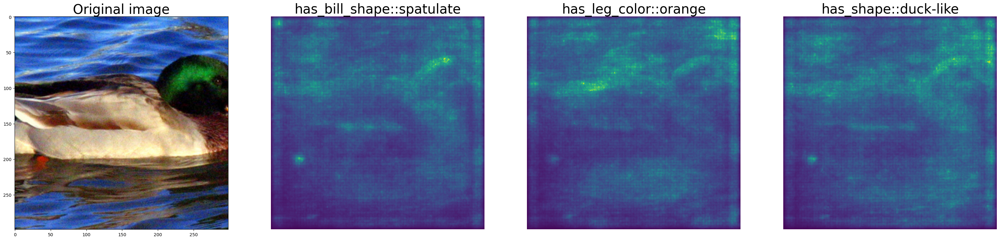

In [12]:
concept_list = [5,273,225]

#Test NoN majority joint model
model_path = r'NoMajority_models\Joint_CKPT_NoMajority\best_Joint_model.pth'

#Load the model
Joint_model = torch.load(model_path,map_location=torch.device('cpu'),weights_only=False)
Joint_model.eval()

XtoC_Model = Joint_model.XtoC_model


sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

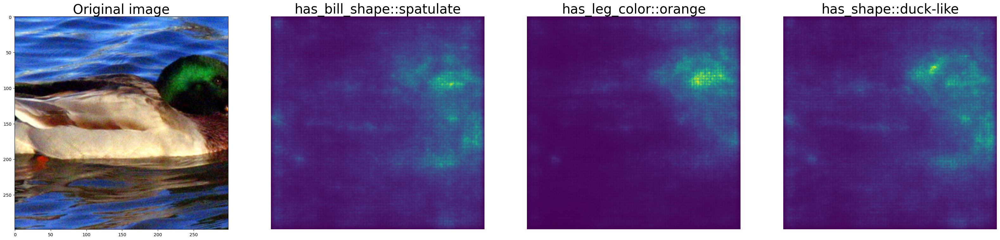

In [13]:
concept_list = [5,273,225]
XtoC_Model = torch.load(r'NoMajority_models\Concepts_CKPT_NoMajority\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

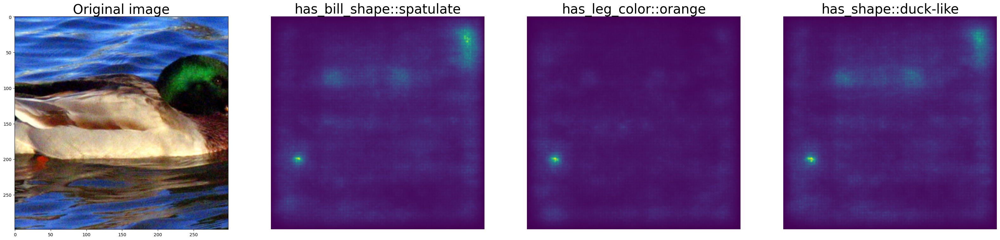

In [14]:
XtoC_Model = torch.load(r'NoMajority_models\Concepts_CKTP_Resize\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

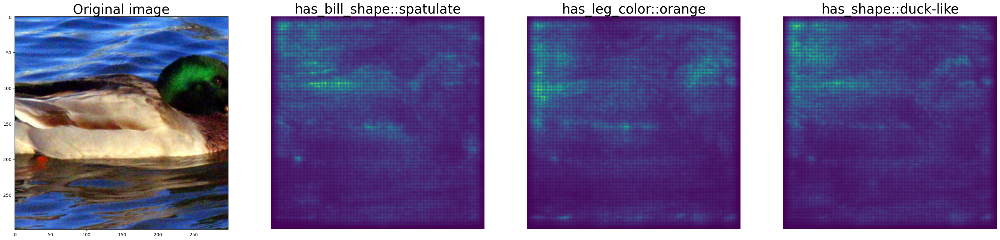

In [15]:
XtoC_Model = torch.load(r'NoMajority_models\Concepts_CKTP_NoPretraining\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()
sailency_maps = get_saliency_maps(X,concept_list,XtoC_Model,method_type='noise_tunnel')

plot_sailency(img,sailency_maps,concept_list,concept_names,coordinates)

In [16]:
#print full df
display_scrollable_dataframe(Full_df.sort_values(by=['Concepts'],ascending=False))

,Concept,Label,Majority Label,Joint,Joint weights,Concepts,Independent weights,Rezise Concepts,Rezise Independent weights,NoN-MV Label distribution,MV label ditribution
145,has_eye_color::black,True,True,0.84,0.06,0.79,-2.0,0.82,0.62,0.837462,0.960
225,has_shape::duck-like,True,True,0.93,1.10,0.69,2.0,0.13,-2.29,0.061334,0.050
220,has_size::medium_(9_-_16_in),True,True,0.90,0.65,0.63,0.0,0.21,-4.39,0.196386,0.185
5,has_bill_shape::spatulate,True,True,0.96,1.39,0.63,7.0,0.09,0.84,0.039786,0.020
54,has_breast_pattern::solid,True,True,0.43,-0.06,0.47,-2.0,0.49,0.09,0.548269,0.645
149,has_bill_length::about_the_same_as_head,True,True,0.68,0.34,0.45,-1.0,0.43,2.57,0.362233,0.340
106,has_breast_color::brown,True,True,0.44,0.74,0.37,8.0,0.24,0.31,0.113590,0.065
236,has_back_pattern::solid,False,False,0.14,-0.17,0.37,-2.0,0.37,1.84,0.365032,0.495
289,has_bill_color::black,False,False,0.27,-0.37,0.37,-1.0,0.22,-1.03,0.441805,0.490
244,has_belly_pattern::solid,False,True,0.22,-0.07,0.36,-3.0,0.42,-0.60,0.573465,0.745


In [17]:
#Reinitialize concept dict
Concept_dict={"Concept":concept_names,
                    "Label": NoN_Majority_C[mask].numpy().astype(bool),
                    #"Label distribution": np.mean(NoN_Majority_concepts,axis=0)[mask],
                    "Majority Label": Majority_C.numpy().astype(bool),
                    #"Majority ditribution": np.mean(Majority_concepts,axis=0)
                      }

In [18]:
#Test NoN majority joint model
model_path = r'NoMajority_models\Joint_CKTP_resize\best_Joint_model.pth'

#Load the model
Joint_model = torch.load(model_path,map_location=torch.device('cpu'),weights_only=False)
Joint_model.eval()
Joint_model.use_sigmoid = True

#Make prediction
C_hat,Y_hat = Joint_model(X)
C_hat_probability = torch.sigmoid(C_hat)
Y_hat = torch.softmax(Y_hat,dim=1)
print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")

#Make Concept prediction and other stuff
weights = Joint_model.CtoY_model.linear.weight[Y.argmax().item()]
Concept_dict["Resized Joint"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)
Concept_dict["Resized Joint weights"] = weights.detach().numpy().round(2)

Predicted class: 118.House_Sparrow true class: 087.Mallard probability of true class: 0.005023895297199488


In [19]:
# Test the concept model with NoN majority voting
XtoC_Model = torch.load(r'NoMajority_models\Concepts_CKTP_Resize\best_XtoC_model.pth',map_location=torch.device('cpu'),weights_only=False)
XtoC_Model.eval()

CtoY_Model = torch.load(r'NoMajority_models\Sequential_CKTP__Resize\best_CtoY_model.pth',map_location=torch.device('cpu'),weights_only=False)
CtoY_Model.eval()
CtoY_model = CtoY_Model.float()

#Make prediction
C_hat = XtoC_Model(X)
C_hat_probability = torch.sigmoid(C_hat)

Y_hat = torch.softmax(CtoY_Model(C_hat_probability),dim=1)

print(f"Predicted class: {class_names[Y_hat.argmax().item()]} true class: {class_names[Y.argmax().item()]} probability of true class: {Y_hat[0,Y.argmax()].item()}")

#Make Concept prediction and other stuff
weights = CtoY_Model.linear.weight[Y.argmax().item()]

Concept_dict["Resized Concepts"] = np.round(C_hat_probability.detach().numpy()[0][mask],2)
Concept_dict["Resized weights"] = weights.detach().numpy().round(2)

Predicted class: 001.Black_footed_Albatross true class: 087.Mallard probability of true class: 0.0026859831996262074


In [20]:
Full_df=pd.DataFrame(Concept_dict)

selected_list = np.where(np.logical_or(Concept_dict["Resized Joint"]>0.5,Concept_dict["Resized Concepts"]>0.5))
Selected_df = Full_df.loc[selected_list] #.sort_values("Sequential weights") #.loc[selected_list]
display_scrollable_dataframe(Selected_df)

,Concept,Label,Majority Label,Resized Joint,Resized Joint weights,Resized Concepts,Resized weights
10,has_wing_color::brown,True,False,0.59,0.03,0.61,0.42
25,has_upperparts_color::brown,True,True,0.55,0.08,0.59,-0.42
51,has_underparts_color::white,False,False,0.53,-0.10,0.38,-0.21
54,has_breast_pattern::solid,True,True,0.61,-0.13,0.49,0.09
59,has_back_color::brown,False,False,0.52,0.06,0.48,-3.87
145,has_eye_color::black,True,True,0.79,-0.00,0.82,0.62
151,has_bill_length::shorter_than_head,False,False,0.60,-0.51,0.33,-4.32
209,has_belly_color::white,False,False,0.54,-0.12,0.36,0.29
235,has_shape::perching-like,False,False,0.53,-0.72,0.31,-4.57
244,has_belly_pattern::solid,False,True,0.58,-0.19,0.42,-0.60


In [21]:
print(Selected_df.to_latex(index=False))

\begin{tabular}{lrrrrrr}
\toprule
Concept & Label & Majority Label & Resized Joint & Resized Joint weights & Resized Concepts & Resized weights \\
\midrule
has_wing_color::brown & True & False & 0.590000 & 0.030000 & 0.610000 & 0.420000 \\
has_upperparts_color::brown & True & True & 0.550000 & 0.080000 & 0.590000 & -0.420000 \\
has_underparts_color::white & False & False & 0.530000 & -0.100000 & 0.380000 & -0.210000 \\
has_breast_pattern::solid & True & True & 0.610000 & -0.130000 & 0.490000 & 0.090000 \\
has_back_color::brown & False & False & 0.520000 & 0.060000 & 0.480000 & -3.870000 \\
has_eye_color::black & True & True & 0.790000 & -0.000000 & 0.820000 & 0.620000 \\
has_bill_length::shorter_than_head & False & False & 0.600000 & -0.510000 & 0.330000 & -4.320000 \\
has_belly_color::white & False & False & 0.540000 & -0.120000 & 0.360000 & 0.290000 \\
has_shape::perching-like & False & False & 0.530000 & -0.720000 & 0.310000 & -4.570000 \\
has_belly_pattern::solid & False & True & 0

In [22]:
display_scrollable_dataframe(Full_df.sort_values(by=['Majority Label',"Label"],ascending=False))

,Concept,Label,Majority Label,Resized Joint,Resized Joint weights,Resized Concepts,Resized weights
5,has_bill_shape::spatulate,True,True,0.04,0.75,0.09,0.84
21,has_wing_color::white,True,True,0.25,0.19,0.14,-1.38
25,has_upperparts_color::brown,True,True,0.55,0.08,0.59,-0.42
36,has_upperparts_color::white,True,True,0.24,0.19,0.10,-0.02
54,has_breast_pattern::solid,True,True,0.61,-0.13,0.49,0.09
90,has_upper_tail_color::black,True,True,0.29,-0.01,0.06,-1.92
106,has_breast_color::brown,True,True,0.19,0.40,0.24,0.31
145,has_eye_color::black,True,True,0.79,-0.00,0.82,0.62
149,has_bill_length::about_the_same_as_head,True,True,0.36,0.14,0.43,2.57
220,has_size::medium_(9_-_16_in),True,True,0.20,0.39,0.21,-4.39


In [23]:
df=pd.DataFrame(Concept_dict).sort_values(by=['Majority Label',"Label"],ascending=False)
latex_table = df.to_latex(index=False)
print(latex_table)

\begin{tabular}{lrrrrrr}
\toprule
Concept & Label & Majority Label & Resized Joint & Resized Joint weights & Resized Concepts & Resized weights \\
\midrule
has_bill_shape::spatulate & True & True & 0.040000 & 0.750000 & 0.090000 & 0.840000 \\
has_wing_color::white & True & True & 0.250000 & 0.190000 & 0.140000 & -1.380000 \\
has_upperparts_color::brown & True & True & 0.550000 & 0.080000 & 0.590000 & -0.420000 \\
has_upperparts_color::white & True & True & 0.240000 & 0.190000 & 0.100000 & -0.020000 \\
has_breast_pattern::solid & True & True & 0.610000 & -0.130000 & 0.490000 & 0.090000 \\
has_upper_tail_color::black & True & True & 0.290000 & -0.010000 & 0.060000 & -1.920000 \\
has_breast_color::brown & True & True & 0.190000 & 0.400000 & 0.240000 & 0.310000 \\
has_eye_color::black & True & True & 0.790000 & -0.000000 & 0.820000 & 0.620000 \\
has_bill_length::about_the_same_as_head & True & True & 0.360000 & 0.140000 & 0.430000 & 2.570000 \\
has_size::medium_(9_-_16_in) & True & True & 